# Importing Libraries

In [1]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from pandas_profiling import ProfileReport

# Importing the DataSet

In [2]:
data = pd.read_csv('C:/Users/abusa/Desktop/datasheet/data.csv')
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


# Encode the Categorical Data values

In [3]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
data.iloc[:,1:2] = labelencoder.fit_transform(data.iloc[:,1:2])

C:\Users\abusa\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:251: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


# Corelation

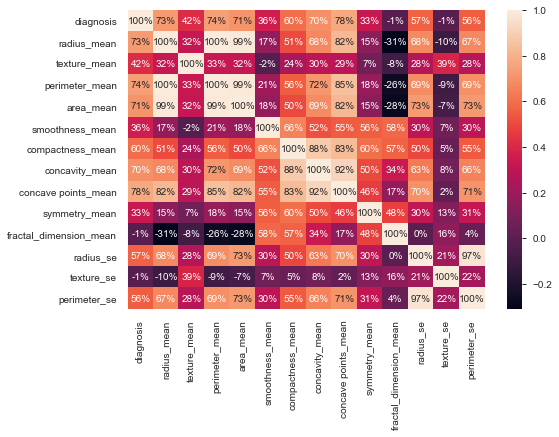

In [4]:
import seaborn as sns
j = data.iloc[:,1:15].corr()
sns.heatmap(j ,annot=True,fmt='.0%')

# Pandas Profiling

Data Visualization

In [5]:
profile = ProfileReport(data.iloc[:,2:15], title='Pandas Profiling Report', explorative=True)

In [6]:
profile

In [7]:
profile.to_file('breast.html')

# Get the count of the number of Malignant(M) and Benign(B) cells

In [8]:
counts = data['diagnosis'].value_counts()
counts

0    357
1    212
Name: diagnosis, dtype: int64

# Visualize the Count

Text(0, 0.5, 'count')

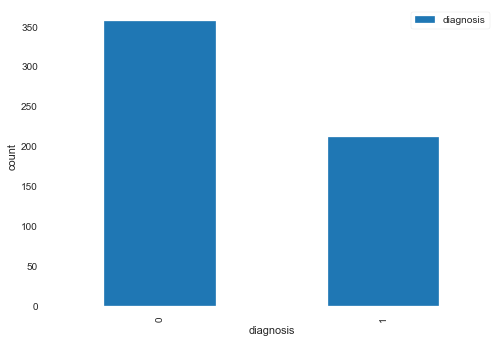

In [9]:
counts.plot(kind='bar')
plt.legend()
plt.xlabel('diagnosis')
plt.ylabel('count')

In [10]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
data.iloc[:,1:2] = labelencoder.fit_transform(data.iloc[:,1:2])

C:\Users\abusa\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:251: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


# Split the data set into Independent(x) and Dependent(y) data set

In [11]:
x = data[['perimeter_mean','radius_mean','area_mean','concave points_mean','concavity_mean','radius_se','perimeter_se']]
y = data['diagnosis']

# Splitting The Data Set into Training Set And Test Set

In [12]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x , y , test_size=0.25,random_state=42)

# Scale the data(Feature Scaling)

In [13]:
from sklearn.preprocessing import StandardScaler
standardscaler = StandardScaler()
x_train = standardscaler.fit_transform(x_train)
x_test = standardscaler.fit_transform(x_test)

In [14]:
x_train

array([[-0.41172595, -0.34913849, -0.39047943, ..., -0.82617052,
        -0.86971355, -0.83481506],
       [-0.13367256, -0.20468665, -0.27587995, ...,  0.72631375,
        -0.04022275,  0.10947722],
       [-0.31739376, -0.32931176, -0.36435749, ..., -0.59730963,
        -0.58145327, -0.22279145],
       ...,
       [-0.06529202,  0.04739597, -0.06269121, ..., -1.02166382,
        -0.95007703, -0.96423752],
       [-0.03151368, -0.04040808, -0.15566285, ...,  0.32004428,
        -0.63351482, -0.60232247],
       [-0.6040977 , -0.5502381 , -0.55114341, ..., -0.81050558,
        -0.73274624, -0.80235203]])

# Create function for models

In [15]:
def models(x_train,y_train):
    from sklearn.linear_model import LogisticRegression
    logisticregression = LogisticRegression(random_state = 42)
    logisticregression.fit(x_train,y_train)
    
    from sklearn.tree import DecisionTreeClassifier
    DC = DecisionTreeClassifier(criterion = 'entropy',random_state=42)
    DC.fit(x_train,y_train)
    
    from sklearn.ensemble import RandomForestClassifier
    RF = RandomForestClassifier(n_estimators=300, criterion = 'entropy',random_state=42)
    RF.fit(x_train,y_train)
    
    from sklearn.svm import SVC
    svc = SVC(kernel = 'rbf' , random_state=42)
    svc.fit(x_train,y_train)
    
    from sklearn.naive_bayes import GaussianNB
    gb = GaussianNB()
    gb.fit(x_train,y_train)
    
    print('[0] Logistic regression accuracy =',logisticregression.score(x_train,y_train))
    print('[1] Descision Tree Classifier accuracy =',DC.score(x_train,y_train))
    print('[3] Random Forest Classifier =',RF.score(x_train,y_train))
    print('[3] SVM accuracy =',svc.score(x_train,y_train))
    print('[4] GaussianNB accuracy =',gb.score(x_train,y_train))
    
    return logisticregression,DC,RF,svc,gb
    

In [16]:
model = models(x_train,y_train)

[0] Logistic regression accuracy = 0.9248826291079812
[1] Descision Tree Classifier accuracy = 1.0
[3] Random Forest Classifier = 1.0
[3] SVM accuracy = 0.9342723004694836
[4] GaussianNB accuracy = 0.8967136150234741


# Test model accuracy on test data on confusion matrix

In [17]:
from sklearn.metrics import confusion_matrix
for i in range(len(model)):
    print('model',i)
    cm = confusion_matrix(y_test,model[i].predict(x_test))
    TP=cm[0][0]
    TN=cm[1][1]
    FP=cm[1][0]
    FN=cm[0][1]
    print(cm)
    print('Testing accuracy:',(TP+TN)/(TP+TN+FP+FN))

model 0
[[84  5]
 [ 6 48]]
Testing accuracy: 0.9230769230769231
model 1
[[84  5]
 [ 7 47]]
Testing accuracy: 0.916083916083916
model 2
[[85  4]
 [ 6 48]]
Testing accuracy: 0.9300699300699301
model 3
[[85  4]
 [ 7 47]]
Testing accuracy: 0.9230769230769231
model 4
[[83  6]
 [ 7 47]]
Testing accuracy: 0.9090909090909091


In [18]:
y_Pred = model[2].predict(x_test)
print(y_Pred)
print('------------------------------------------------------')
print(y_test.values)

[0 1 1 0 0 1 1 1 1 0 0 1 0 1 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 1 0 1
 0 0 0 0 0 0 1 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 1 1 0 1 0 0 1 1 0 0 0 1 0 0 1
 0 0 1 0 1 0 0 0 1 1 0 0 1 0 1 1 0 0 1 1 1 0 0 0 1 0 0 1 1 0 1 0]
------------------------------------------------------
[0 1 1 0 0 1 1 1 0 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 1
 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 1 1 0 0 0 1 1 0 0 1 1 0 1
 0 0 0 1 0 0 1 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1 0 0 1
 0 0 1 0 1 0 0 0 1 0 0 0 1 0 1 1 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 0]
